# <center>Electoral Complexity Analysis 2019: Electoral Sections <center>
## <center>Exploratory Analysis and Construction of Electoral Complexity Indexes <center>

<br>

#### <center>Autor: Miguel David Alvarez Hernández (mdalvarezh@gmail.com)<center>

In [1]:
import datetime
now = datetime.datetime.now()
print ("Última versión:")
print (now.strftime("%Y-%m-%d %H:%M:%S"))

Última versión:
2021-11-13 19:01:10


# Setup

In [2]:
import pandas as pd  
import numpy as np
import pandas_profiling
from itertools import combinations 
from dateutil.parser import parse 
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import plotly.express as px

In [3]:
#parámetros de las gráficas 3d
elev = 50.0
azim = 120.0

# Importación de datos procesados

In [4]:
#datos procesados
datos = pd.read_csv("E:/Google Drive/PREPRINTS/[Articulo]_Complexity Geoelectoral System/1_Procesamiento/Resultados_Datos-procesados_secc2019.csv", encoding='utf-8')

In [5]:
print(datos.dtypes)
datos

EDO                   int64
NOMBRE_ESTADO        object
MUN                   int64
NOMBRE_MUNICIPIO     object
DTO                   int64
SECC                  int64
Coef_Var_PE         float64
Coef_Var_LNE        float64
Var_Prop_PE         float64
Var_Prop_LNE        float64
Autocorr_PE         float64
Autocorr_LNE        float64
Razon_LNE_PE        float64
PE                  float64
LNE                 float64
TC_LNE_2019         float64
TIPO_SECCION         object
Area_Km2            float64
Densidad_LNE        float64
dtype: object


,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,DTO,SECC,Coef_Var_PE,Coef_Var_LNE,Var_Prop_PE,Var_Prop_LNE,Autocorr_PE,Autocorr_LNE,Razon_LNE_PE,PE,LNE,TC_LNE_2019,TIPO_SECCION,Area_Km2,Densidad_LNE
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,1,404,0.010392,0.013701,0.011281,0.015822,0.547527,0.494467,0.992982,804.0,796.0,-0.008717,R,0.255615,3114.052233
1,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,1,470,0.009898,0.015790,0.011420,0.018778,0.606021,0.459351,0.986038,1340.0,1311.0,-0.005311,M,0.497880,2633.165586
2,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,1,471,0.006650,0.011982,0.008169,0.014270,0.707951,0.512860,0.989025,1608.0,1582.0,-0.006905,U,0.438174,3610.437533
3,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,1,472,0.010460,0.014940,0.012687,0.018002,0.795567,0.617178,0.990770,1414.0,1394.0,-0.014841,U,0.404232,3448.510713
4,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,1,473,0.011303,0.011558,0.013614,0.013143,0.893573,0.439638,0.990124,8526.0,8412.0,0.027859,M,2.190191,3840.761507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68389,32,ZACATECAS,11,TRINIDAD GARCIA DE LA CADENA,2,352,0.022106,0.027715,0.025957,0.032934,0.949893,0.919404,0.973718,407.0,395.0,0.076294,U,0.216138,1827.533786
68390,32,ZACATECAS,11,TRINIDAD GARCIA DE LA CADENA,2,353,0.027591,0.035514,0.031829,0.041410,0.937516,0.939714,0.972815,382.0,374.0,0.119760,M,0.432270,865.200585
68391,32,ZACATECAS,11,TRINIDAD GARCIA DE LA CADENA,2,354,0.049990,0.069392,0.056654,0.077790,0.970217,0.942633,0.973603,103.0,101.0,0.262500,R,58.018000,1.740839
68392,32,ZACATECAS,11,TRINIDAD GARCIA DE LA CADENA,2,356,0.033608,0.047956,0.039083,0.055342,0.947350,0.977154,0.971920,367.0,360.0,0.165049,R,2.157981,166.822568


In [6]:
#se reordena y eliminan del dataframe las variables que no se usarán
datos_secc = datos.drop(columns=['Coef_Var_PE', 'Var_Prop_PE', 'Autocorr_PE','Area_Km2'])
datos_secc = datos_secc.reindex(columns= ['EDO','NOMBRE_ESTADO','MUN','NOMBRE_MUNICIPIO','DTO','SECC','TIPO_SECCION','LNE','Densidad_LNE','Razon_LNE_PE','TC_LNE_2019','Coef_Var_LNE','Var_Prop_LNE','Autocorr_LNE'])

#verificar si hay valores nulos en datos_secc
datos_secc.isnull().sum()

EDO                 0
NOMBRE_ESTADO       0
MUN                 0
NOMBRE_MUNICIPIO    0
DTO                 0
SECC                0
TIPO_SECCION        0
LNE                 0
Densidad_LNE        0
Razon_LNE_PE        0
TC_LNE_2019         0
Coef_Var_LNE        0
Var_Prop_LNE        0
Autocorr_LNE        4
dtype: int64

In [7]:
#se eliminan las filas (secciones) con valores vacíos
datos_secc_limpio = datos_secc.dropna()
datos_secc_limpio = datos_secc_limpio.reset_index(drop=True) #para reordenar el índice del nuevo dataframe
datos_secc_limpio.isnull().sum()

EDO                 0
NOMBRE_ESTADO       0
MUN                 0
NOMBRE_MUNICIPIO    0
DTO                 0
SECC                0
TIPO_SECCION        0
LNE                 0
Densidad_LNE        0
Razon_LNE_PE        0
TC_LNE_2019         0
Coef_Var_LNE        0
Var_Prop_LNE        0
Autocorr_LNE        0
dtype: int64

In [8]:
#se separan los indicadores de los metadatos 

#metadatos
metadatos = datos_secc_limpio[['EDO', 'NOMBRE_ESTADO', 'MUN', 'NOMBRE_MUNICIPIO', 'DTO','SECC','TIPO_SECCION']]
metadatos.head()

#indicadores (features)
datos_secc_limpio_f = datos_secc_limpio[['LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE','Autocorr_LNE']]
datos_secc_limpio_f

,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
0,796.0,3114.052233,0.992982,-0.008717,0.013701,0.015822,0.494467
1,1311.0,2633.165586,0.986038,-0.005311,0.015790,0.018778,0.459351
2,1582.0,3610.437533,0.989025,-0.006905,0.011982,0.014270,0.512860
3,1394.0,3448.510713,0.990770,-0.014841,0.014940,0.018002,0.617178
4,8412.0,3840.761507,0.990124,0.027859,0.011558,0.013143,0.439638
...,...,...,...,...,...,...,...
68385,395.0,1827.533786,0.973718,0.076294,0.027715,0.032934,0.919404
68386,374.0,865.200585,0.972815,0.119760,0.035514,0.041410,0.939714
68387,101.0,1.740839,0.973603,0.262500,0.069392,0.077790,0.942633
68388,360.0,166.822568,0.971920,0.165049,0.047956,0.055342,0.977154


## Análisis exploratorio de los base indicators (sin transformar)

In [9]:
#resumen estadístico
datos_secc_limpio_f.describe()

,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
count,68390.000000,68390.000000,68390.000000,68390.000000,68390.000000,68390.000000,68390.000000
mean,1317.706770,8447.244220,0.987840,0.048519,0.019702,0.022812,0.826309
std,1389.056893,12809.782401,0.004840,0.043990,0.010203,0.011344,0.218892
min,3.000000,0.003152,0.874051,-0.347826,0.001439,0.001682,-0.741620
25%,629.000000,1208.624917,0.986467,0.027397,0.013544,0.015612,0.762336
50%,1031.000000,4125.738947,0.988685,0.049624,0.018081,0.021109,0.929272
75%,1564.000000,11449.884027,0.990409,0.070132,0.023574,0.027537,0.970013
max,54343.000000,885626.443839,1.000000,1.940299,0.332023,0.333093,0.999452


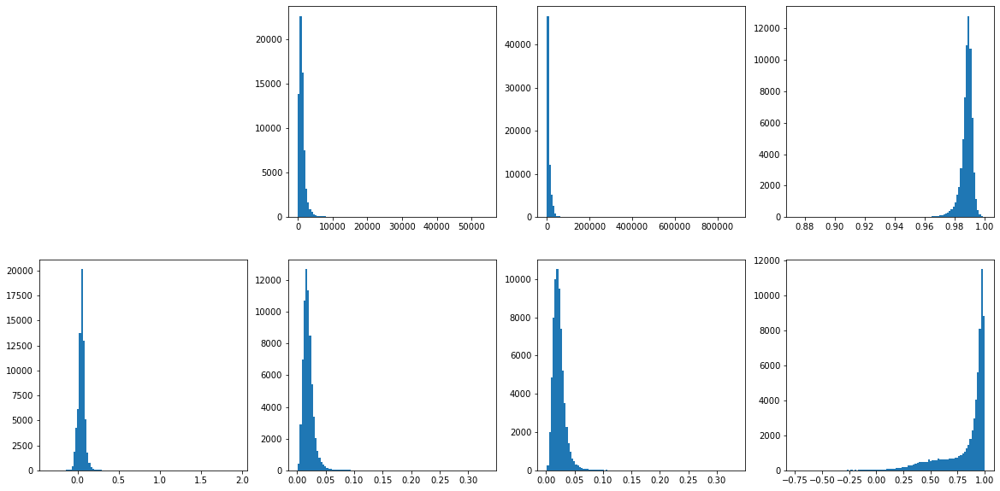

In [10]:
#histogramas de los base indicators 
#print(sum(datos_secc['LNE'] > 500000))
plt.figure(figsize=(20,10)) 

plt.subplot(242)
H = plt.hist(datos_secc_limpio_f['LNE'], bins = 100)
plt.subplot(243)
H = plt.hist(datos_secc_limpio_f['Densidad_LNE'], bins = 100)
plt.subplot(244)
H = plt.hist(datos_secc_limpio_f['Razon_LNE_PE'], bins = 100)
plt.subplot(245)
H = plt.hist(datos_secc_limpio_f['TC_LNE_2019'], bins = 100)
plt.subplot(246)
H = plt.hist(datos_secc_limpio_f['Coef_Var_LNE'], bins = 100)
plt.subplot(247)
H = plt.hist(datos_secc_limpio_f['Var_Prop_LNE'], bins = 100)
plt.subplot(248)
H = plt.hist(datos_secc_limpio_f['Autocorr_LNE'], bins = 100)

<br>

## Gráficas (heatmap y pair-plot) y análisis de correlación (7 indicadores)

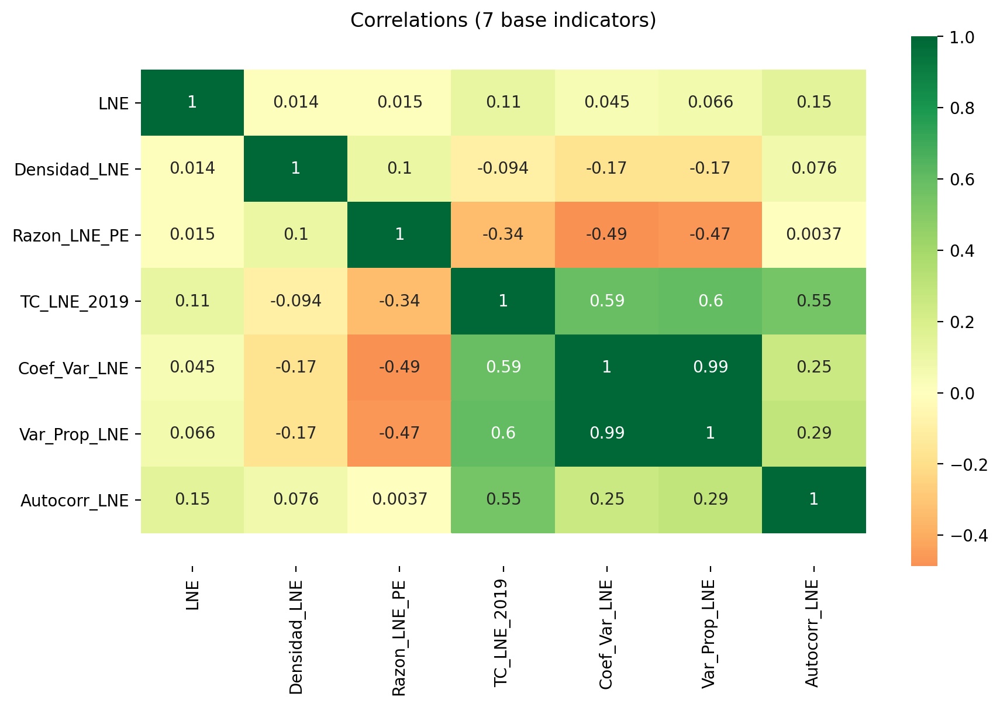

In [11]:
#Plot correlogram
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)

plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(datos_secc_limpio_f.corr(), xticklabels=datos_secc_limpio_f.corr().columns, yticklabels=datos_secc_limpio_f.corr().columns, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Correlations (7 base indicators)')

#se guarda la grafica
plt.savefig('Pyplot_heatmap_ind7.png',dpi=600, bbox_inches="tight")
plt.show() 

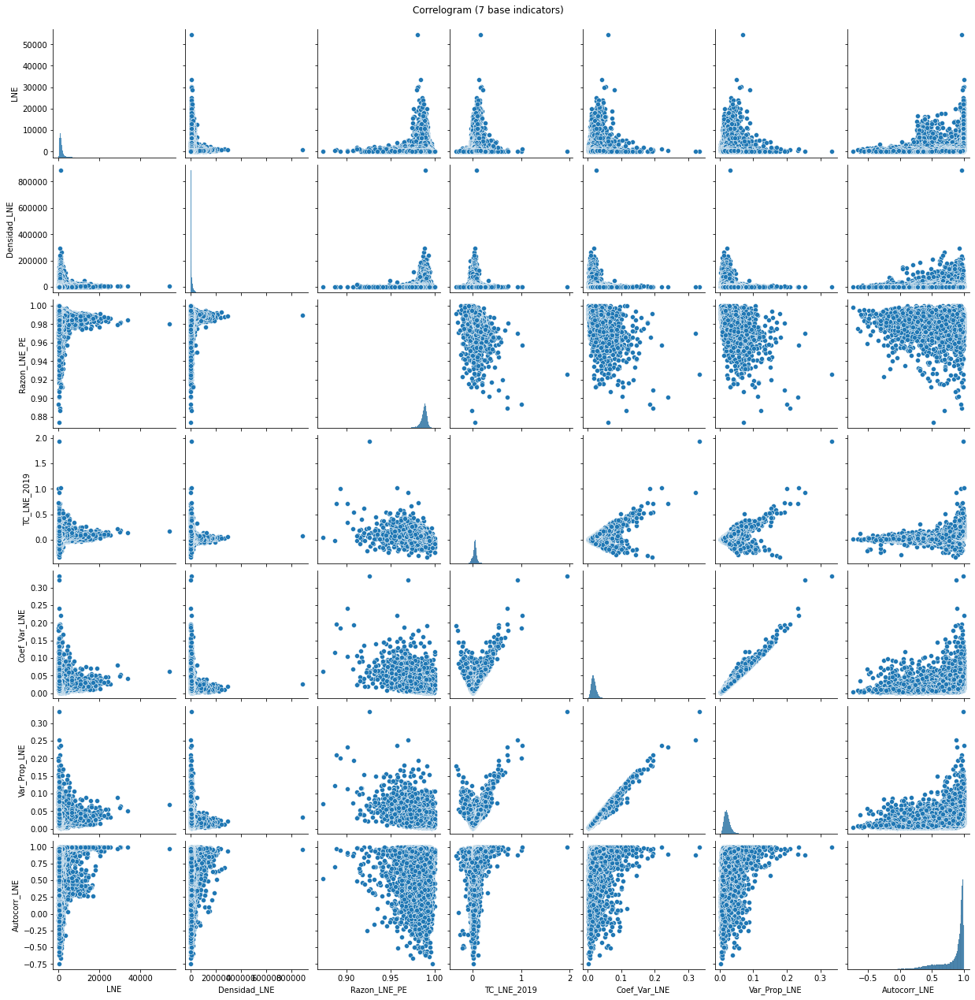

In [12]:
#pair-plot
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)
corr1 = sns.pairplot(datos_secc_limpio_f)
corr1.fig.suptitle("Correlogram (7 base indicators)", y=1.01)
corr1.savefig('Pyplot_correlogram_ind7.png',dpi=600)

<br>

## Gráficas (heatmap y pair-plot) y análisis de correlación (6 indicadores)

In [13]:
datos_secc_limpio_f_ind6 = datos_secc_limpio_f[['LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE','Autocorr_LNE']]

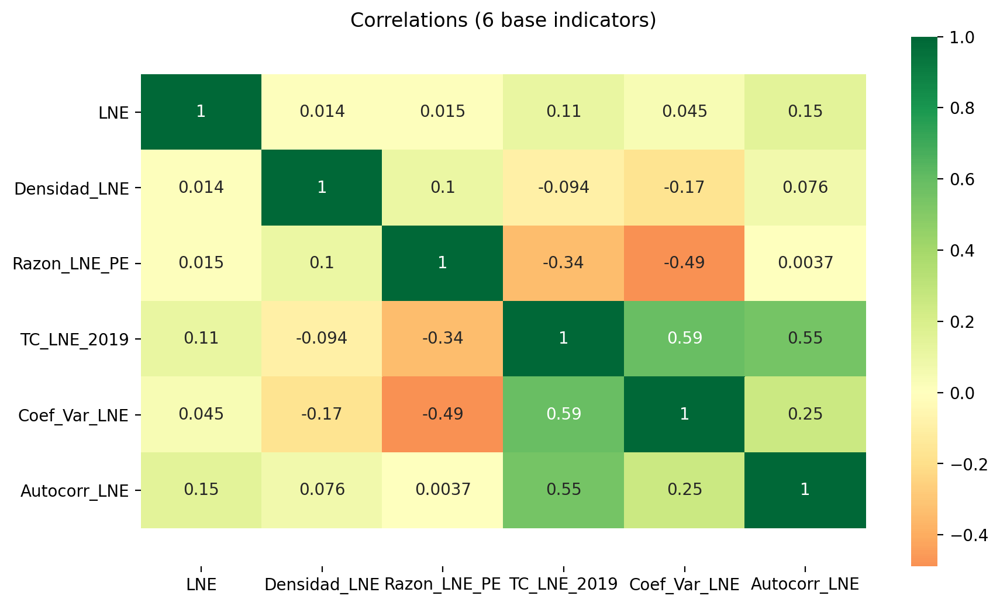

In [14]:
#Plot correlogram
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)

plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(datos_secc_limpio_f_ind6.corr(), xticklabels=datos_secc_limpio_f_ind6.corr().columns, yticklabels=datos_secc_limpio_f_ind6.corr().columns, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Correlations (6 base indicators)')

#se guarda la grafica
plt.savefig('Pyplot_heatmap_ind6.png',dpi=600,bbox_inches="tight")
plt.show() 

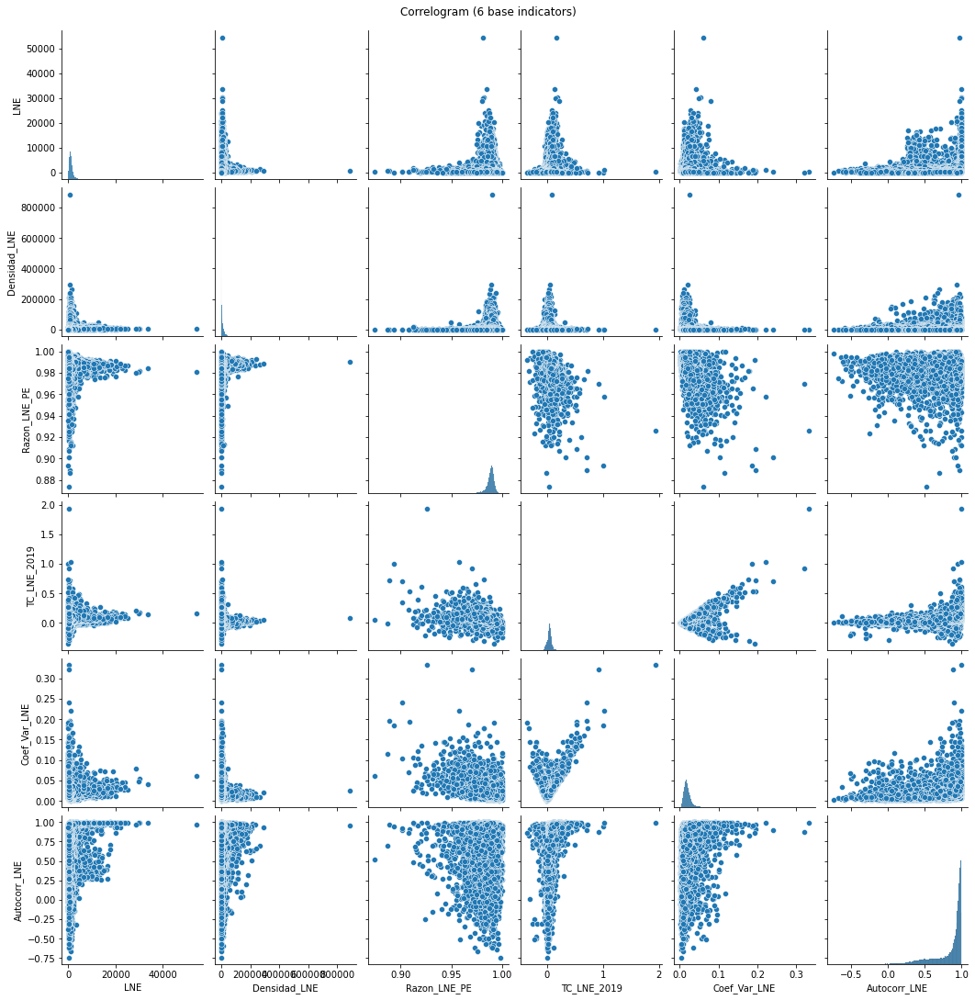

In [15]:
#pair-plot
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)
corr2_tf = sns.pairplot(datos_secc_limpio_f_ind6)
corr2_tf.fig.suptitle("Correlogram (6 base indicators)", y=1.01)
corr2_tf.savefig('Pyplot_correlogram_ind6.png',dpi=600)

<br>

## Análisis exploratorio de los base indicators (7 indicadores con transformación log en LNE y Densidad_LNE)

In [16]:
#se transforman algunos indicadores para analizar escenarios
datos_secc_limpio_f_tf = datos_secc_limpio_f.copy()

#np-log de LNE, Densidad
datos_secc_limpio_f_tf['LNE'] = np.log(datos_secc_limpio_f_tf['LNE'])
datos_secc_limpio_f_tf['Densidad_LNE'] = np.log(datos_secc_limpio_f_tf['Densidad_LNE'])
#datos_secc_limpio_f_tf['NUM_SECC_RUR'] = np.log(datos_secc_limpio_f_tf['NUM_SECC_RUR']+1)

#renombramos algunas columnas
datos_secc_limpio_f_tf=datos_secc_limpio_f_tf.rename(columns={"LNE": "log(LNE)", "Densidad_LNE": "log(Densidad_LNE)"})

#resumen estadístico
datos_secc_limpio_f_tf.describe()

,log(LNE),log(Densidad_LNE),Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
count,68390.000000,68390.000000,68390.000000,68390.000000,68390.000000,68390.000000,68390.000000
mean,6.866598,7.822121,0.987840,0.048519,0.019702,0.022812,0.826309
std,0.812545,2.266739,0.004840,0.043990,0.010203,0.011344,0.218892
min,1.098612,-5.759852,0.874051,-0.347826,0.001439,0.001682,-0.741620
25%,6.444131,7.097239,0.986467,0.027397,0.013544,0.015612,0.762336
50%,6.938284,8.325000,0.988685,0.049624,0.018081,0.021109,0.929272
75%,7.355002,9.345735,0.990409,0.070132,0.023574,0.027537,0.970013
max,10.903071,13.694051,1.000000,1.940299,0.332023,0.333093,0.999452


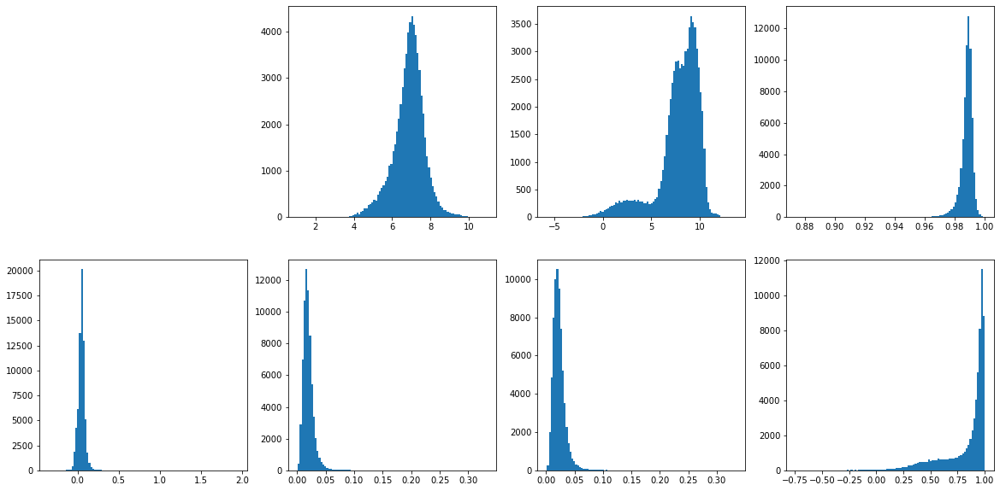

In [17]:
#histogramas de los base indicators 
#print(sum(datos_secc['log(LNE')] > 500000))
plt.figure(figsize=(20,10)) 

plt.subplot(242)
H = plt.hist(datos_secc_limpio_f_tf['log(LNE)'], bins = 100)
plt.subplot(243)
H = plt.hist(datos_secc_limpio_f_tf['log(Densidad_LNE)'], bins = 100)
plt.subplot(244)
H = plt.hist(datos_secc_limpio_f_tf['Razon_LNE_PE'], bins = 100)
plt.subplot(245)
H = plt.hist(datos_secc_limpio_f_tf['TC_LNE_2019'], bins = 100)
plt.subplot(246)
H = plt.hist(datos_secc_limpio_f_tf['Coef_Var_LNE'], bins = 100)
plt.subplot(247)
H = plt.hist(datos_secc_limpio_f_tf['Var_Prop_LNE'], bins = 100)
plt.subplot(248)
H = plt.hist(datos_secc_limpio_f_tf['Autocorr_LNE'], bins = 100)

<br>

## Gráficas (heatmap y pair-plot) y análisis de correlación (7 indicadores con transformación log)

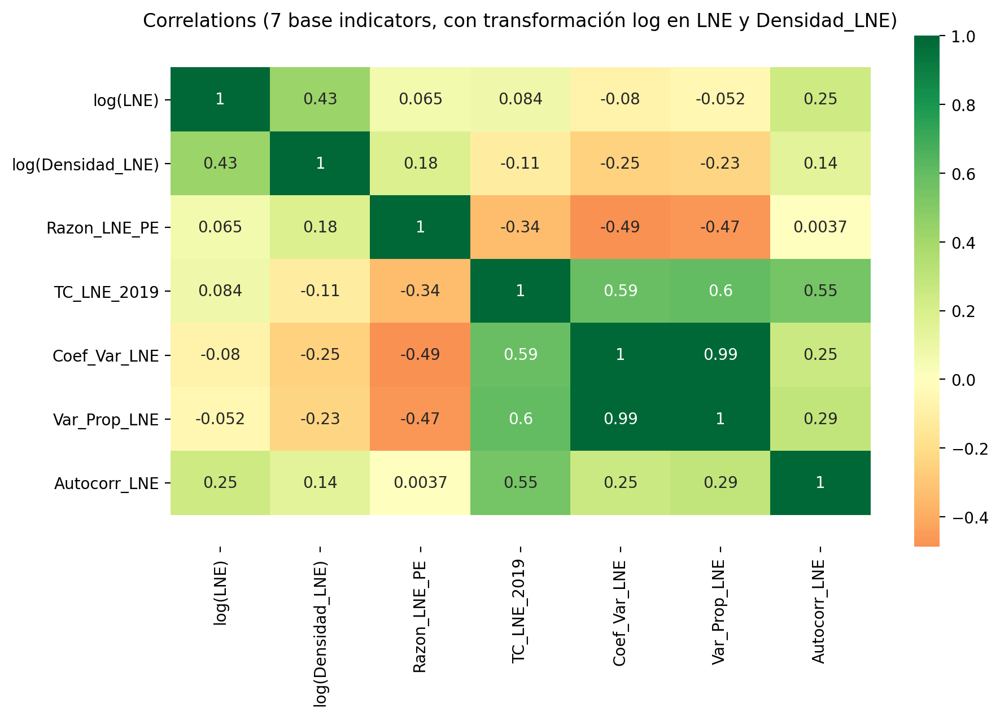

In [18]:
#Plot correlogram
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)

plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(datos_secc_limpio_f_tf.corr(), xticklabels=datos_secc_limpio_f_tf.corr().columns, yticklabels=datos_secc_limpio_f_tf.corr().columns, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Correlations (7 base indicators, con transformación log en LNE y Densidad_LNE)')

#se guarda la grafica
plt.savefig('Pyplot_heatmap_ind7_tf.png',dpi=600,bbox_inches="tight")
plt.show() 

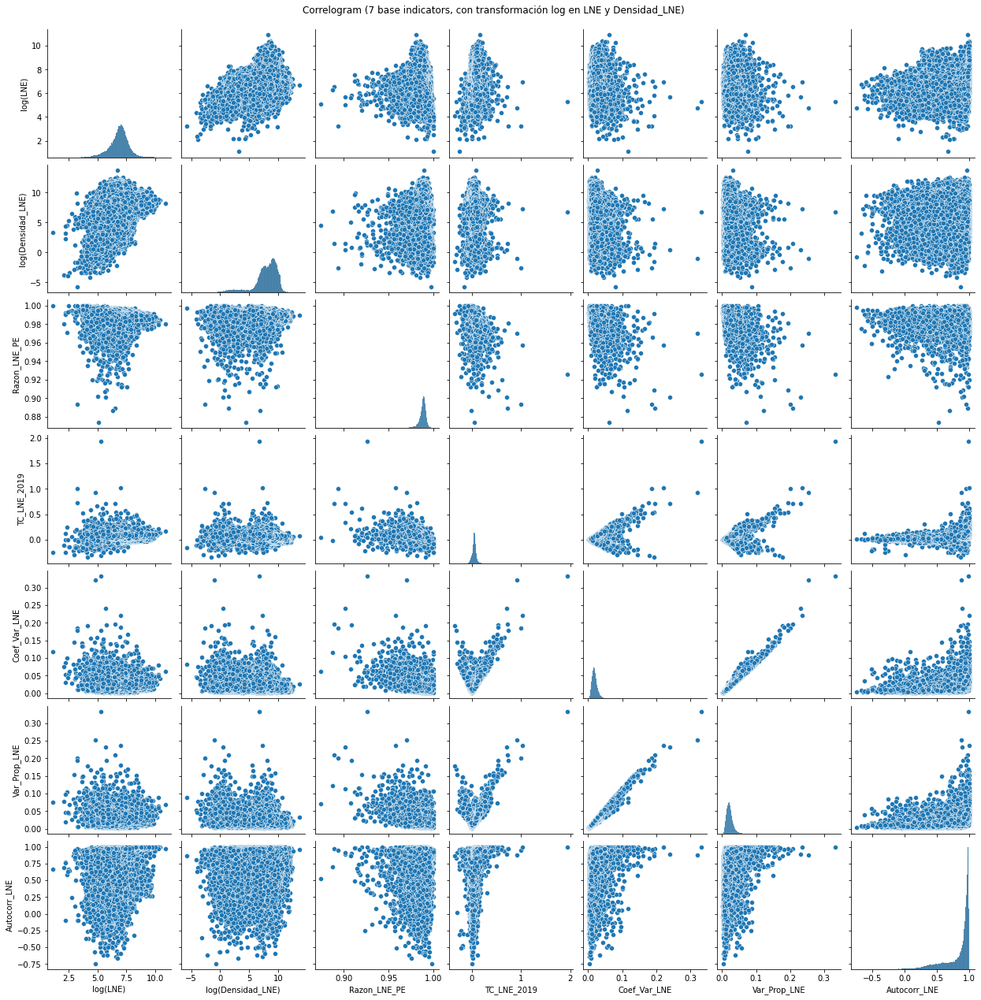

In [19]:
#pair-plot
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)
corr1_tf = sns.pairplot(datos_secc_limpio_f_tf)
corr1_tf.fig.suptitle("Correlogram (7 base indicators, con transformación log en LNE y Densidad_LNE)", y=1.01)
corr1_tf.savefig('Pyplot_correlogram_ind7_tf.png',dpi=600)

<br>

## Gráficas (heatmap y pair-plot) y análisis de correlación (6 indicadores con transformación log)

In [20]:
datos_secc_limpio_f_tf_ind6 = datos_secc_limpio_f_tf[['log(LNE)', 'log(Densidad_LNE)', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE','Autocorr_LNE']]

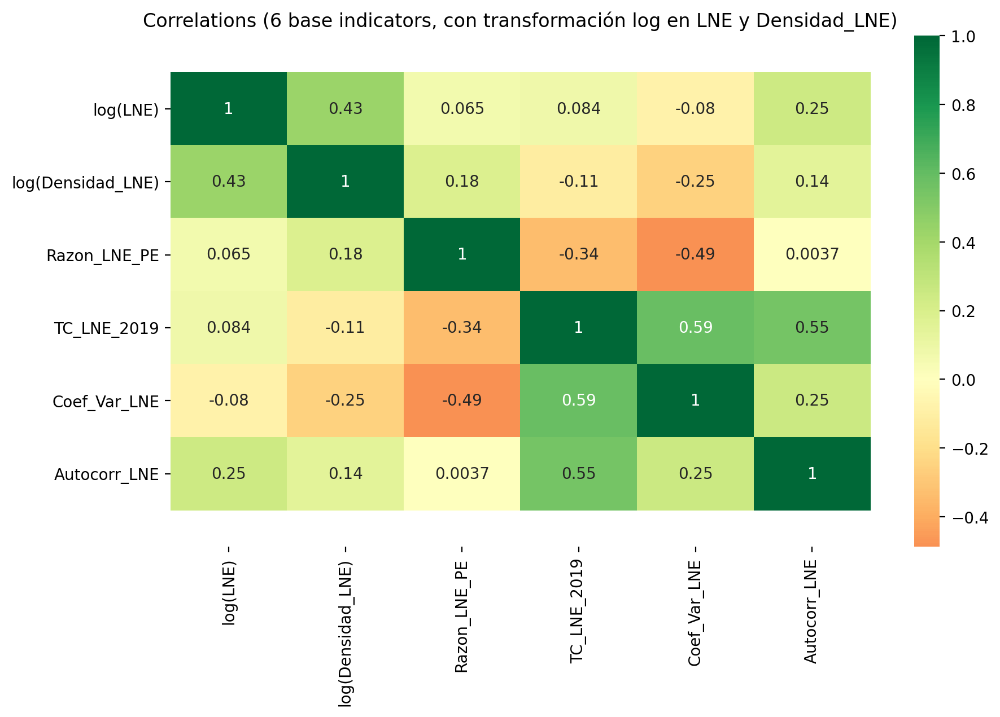

In [21]:
#Plot correlogram
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)

plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(datos_secc_limpio_f_tf_ind6.corr(), xticklabels=datos_secc_limpio_f_tf_ind6.corr().columns, yticklabels=datos_secc_limpio_f_tf_ind6.corr().columns, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Correlations (6 base indicators, con transformación log en LNE y Densidad_LNE)')

#se guarda la grafica
plt.savefig('Pyplot_heatmap_ind6_tf.png',dpi=600,bbox_inches="tight")
plt.show() 

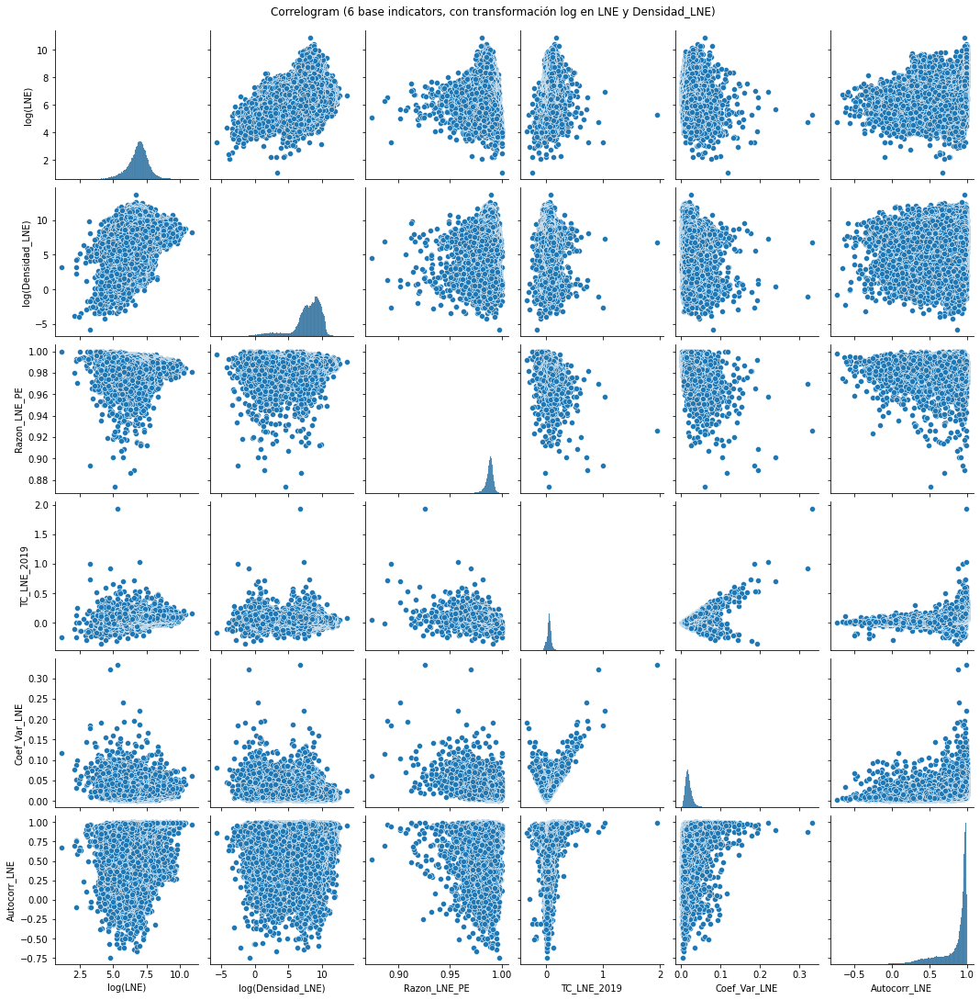

In [22]:
#pair-plot
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)
corr2_tf = sns.pairplot(datos_secc_limpio_f_tf_ind6)
corr2_tf.fig.suptitle("Correlogram (6 base indicators, con transformación log en LNE y Densidad_LNE)", y=1.01)
corr2_tf.savefig('Pyplot_correlogram_ind6_tf.png',dpi=600)

<br>

# Análisis de Componentes Principales (PCA)

### Preprocesamiento de datos

In [23]:
from sklearn.preprocessing import StandardScaler

#Se crean listas para separar los tipos/escenarios de datos

#seleccionamos 6 indicadores
ind6 = ['LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Autocorr_LNE']

#seleccionamos 6 indicadores (con log)
ind6_tf = ['log(LNE)', 'log(Densidad_LNE)', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Autocorr_LNE']

#seleccionamos 7 indicadores
ind7 = ['LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE', 'Autocorr_LNE']

#seleccionamos 7 indicadores (con log)
ind7_tf = ['log(LNE)', 'log(Densidad_LNE)', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE', 'Autocorr_LNE']

#etiquetas
labels = ['EDO', 'NOMBRE_ESTADO', 'MUN', 'NOMBRE_MUNICIPIO', 'DTO','SECC','TIPO_SECCION']


#seleccionamos los valores de solo 6 indicadores (sin Var_Prop_LNE)
x = datos_secc_limpio_f.loc[:, ind6].values

#seleccionamos los valores de solo 6 indicadores (sin Var_Prop_LNE y con log)
x_1 = datos_secc_limpio_f_tf.loc[:, ind6_tf].values

#seleccionamos los valores de los 7 indicadores originales
x_2 = datos_secc_limpio_f.loc[:, ind7].values

#seleccionamos los valores de los 7 indicadores con transformacion log en LNE y Densidad
x_3 = datos_secc_limpio_f_tf.loc[:, ind7_tf].values

#seleccionamos las labels (metadatos)
y = metadatos.loc[:,labels].values

print(x.shape)
print(x_1.shape)
print(x_2.shape)
print(x_3.shape)
print(y.shape)

(68390, 6)
(68390, 6)
(68390, 7)
(68390, 7)
(68390, 7)


In [24]:
#para verificar que no haya valores nulos o infinitos en ind6
print(np.any(np.isnan(x)))
print(np.all(np.isfinite(x)))

#para verificar que no haya valores nulos o infinitos en ind6_tf
print(np.any(np.isnan(x_1)))
print(np.all(np.isfinite(x_1)))

#para verificar que no haya valores nulos o infinitos en ind7
print(np.any(np.isnan(x_2)))
print(np.all(np.isfinite(x_2)))

#para verificar que no haya valores nulos o infinitos en ind7_tf
print(np.any(np.isnan(x_3)))
print(np.all(np.isfinite(x_3)))

False
True
False
True
False
True
False
True


In [25]:
#Estandarizamos los valores de ind6 (normalización)
x = StandardScaler().fit_transform(x)
print(x.shape)

#Estandarizamos los valores de ind6_tf (normalización)
x_1 = StandardScaler().fit_transform(x_1)
print(x_1.shape)

#Estandarizamos los valores de ind7 (normalización)
x_2 = StandardScaler().fit_transform(x_2)
print(x_2.shape)

#Estandarizamos los valores de ind7_tf (normalización)
x_3 = StandardScaler().fit_transform(x_3)
print(x_3.shape)

(68390, 6)
(68390, 6)
(68390, 7)
(68390, 7)


<br>

## PCA con 6 indicadores

In [26]:
from sklearn.decomposition import PCA

#calculo de PCA (con las 6 componentes), y obtención de los valores CP para cada sección
pca_6cp = PCA(n_components=6)
pca_ind6 = pca_6cp.fit_transform(x)

#razones de varianza explicada por cada CP 
print('Razón de varianza explicada por cada CP (n_components=6): %s'
      % str(pca_6cp.explained_variance_ratio_))

#dataframe con los valores de los 6 CP por sección
df_pca_ind6 = pd.DataFrame(data = pca_ind6
             , columns = ['PC1', 'PC2', 'PC3','PC4', 'PC5', 'PC6'])
df_pca_ind6

Razón de varianza explicada por cada CP (n_components=6): [0.36715292 0.2069653  0.15854035 0.14321053 0.07306264 0.05106827]


,PC1,PC2,PC3,PC4,PC5,PC6
0,-2.096167,-0.817115,-0.454275,-0.218703,0.681640,0.002927
1,-1.373654,-1.430664,-0.547472,0.749539,0.031431,-0.057538
2,-1.743078,-0.825861,-0.719741,0.454349,0.066035,0.012552
3,-1.661436,-0.551369,-0.625619,0.062984,0.263714,-0.444679
4,-0.943634,1.379059,-4.294915,2.884325,0.465976,0.799884
...,...,...,...,...,...,...
68385,2.136906,-1.664989,0.694265,0.667680,-1.442056,-0.272315
68386,3.262541,-1.746697,0.806791,0.593926,-1.017143,0.098491
68387,6.944399,-1.978684,1.296734,0.166383,1.526907,1.155820
68388,4.693695,-1.859348,0.963390,0.537345,-0.312791,0.267606


In [27]:
#obtención de los pesos por cada variable
pca_pesos_ind6 = pca_6cp.components_
print(pca_pesos_ind6)

#transformación a un dataframe:
df_pca_pesos_ind6 = pd.DataFrame(pca_pesos_ind6, columns=ind6)
principal_components_pesos = pd.DataFrame(['PC1', 'PC2', 'PC3','PC4', 'PC5', 'PC6'])
df_pca_pesos_ind6.insert(0, 'Principal Components', principal_components_pesos)

#se guarda el último dataframe en un csv
df_pca_pesos_ind6.to_csv(r'Resultados_Secc_PCA_pesos_ind6.csv', index = None)

df_pca_pesos_ind6=df_pca_pesos_ind6.set_index('Principal Components')
df_pca_pesos_ind6

[[ 0.11835223 -0.13463196 -0.40170491  0.58735786  0.55730014  0.38849382]
 [ 0.43815545  0.48142498  0.44442913  0.1514139  -0.20617036  0.55973221]
 [-0.72711206  0.65542368 -0.14182563  0.07721292  0.04885994  0.1151704 ]
 [ 0.51474679  0.54119303 -0.50783002 -0.15472484  0.09036192 -0.39006341]
 [ 0.01877359  0.16259293  0.59840856  0.0774329   0.66724382 -0.40485568]
 [-0.00197514  0.03460744  0.07083266  0.77213154 -0.43719956 -0.45436834]]


,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Autocorr_LNE
Principal Components,,,,,,
PC1,0.118352,-0.134632,-0.401705,0.587358,0.557300,0.388494
PC2,0.438155,0.481425,0.444429,0.151414,-0.206170,0.559732
PC3,-0.727112,0.655424,-0.141826,0.077213,0.048860,0.115170
PC4,0.514747,0.541193,-0.507830,-0.154725,0.090362,-0.390063
PC5,0.018774,0.162593,0.598409,0.077433,0.667244,-0.404856
PC6,-0.001975,0.034607,0.070833,0.772132,-0.437200,-0.454368


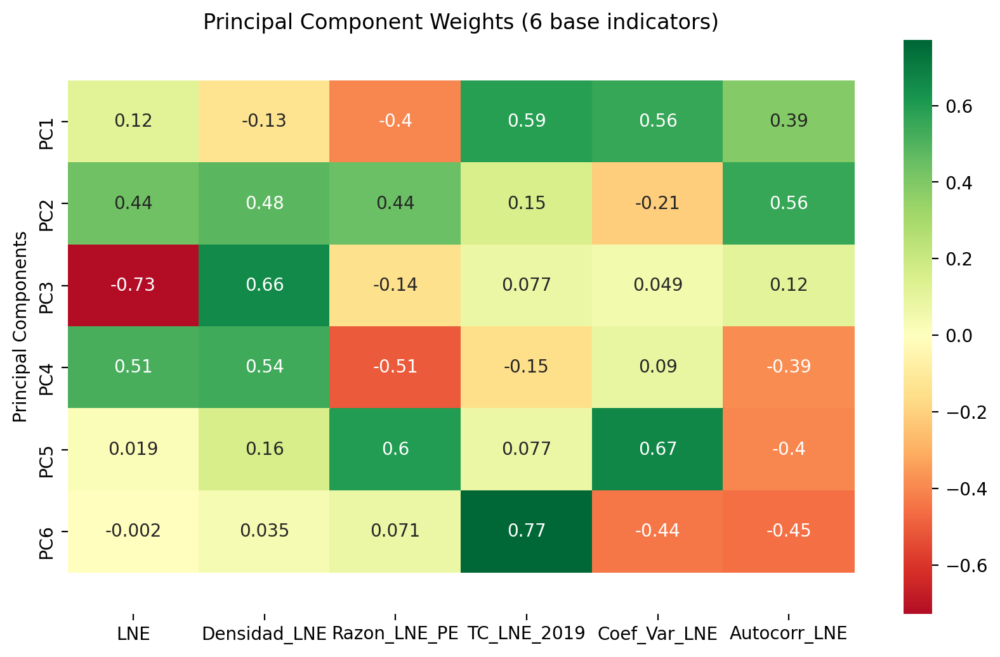

In [28]:
plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(df_pca_pesos_ind6, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Principal Component Weights (6 base indicators)')

plt.savefig('Pyplot_PCA_heatmap_ind6.png',dpi=600,bbox_inches="tight")
plt.show() 

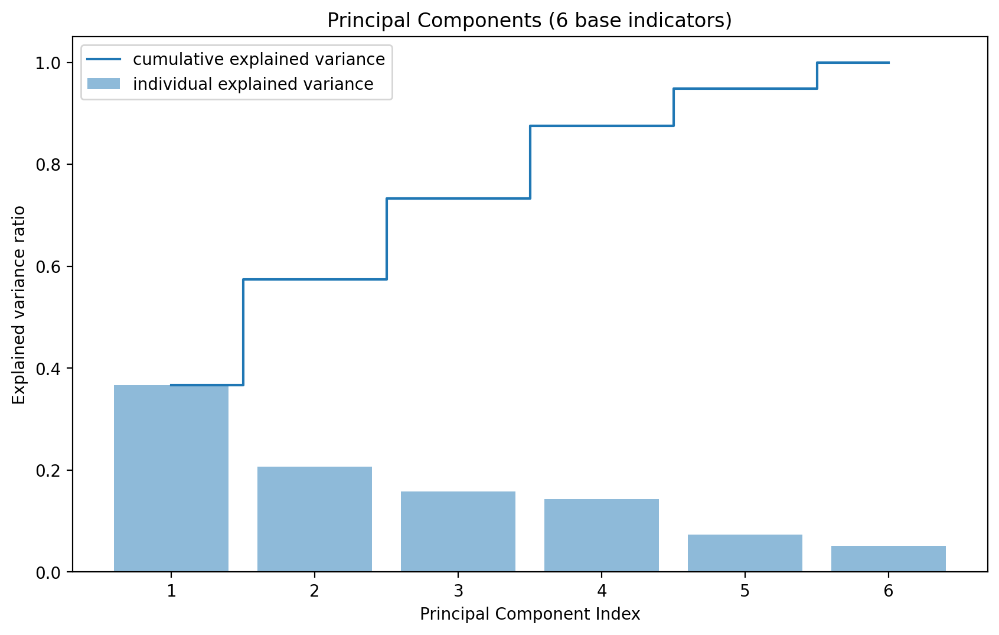

In [29]:

#calculo de la matriz de covarianza y sus correspondientes eigenvalores y eigenvectores
cov_mat = np.cov(x.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# calculate of individual and cumulative sum of explained variances
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# plot explained variances
plt.figure(figsize=(10,6), dpi= 200)
plt.bar(range(1,7), var_exp, alpha=0.5,
        align='center', label='individual explained variance')
plt.step(range(1,7), cum_var_exp, where='mid',
         label='cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal Component Index')
plt.legend(loc='best')
plt.title('Principal Components (6 base indicators)')

plt.savefig('Pyplot_PCA_variance_ind6.png',dpi=600)
plt.show()

In [30]:
#concatenamos los resultados con los metadatos
df_pca_results_ind6 = pd.concat([metadatos[labels], df_pca_ind6], axis = 1)
df_pca_results_ind6.head()
#salvar resultados PCA
df_pca_results_ind6.to_csv(r'Resultados_Secc_PCA_ind6.csv', index = None)

### Proyección de las secciones en el espacio de Componentes Principales (6 indicadores)
Gráfica en el espacio CP1, CP2

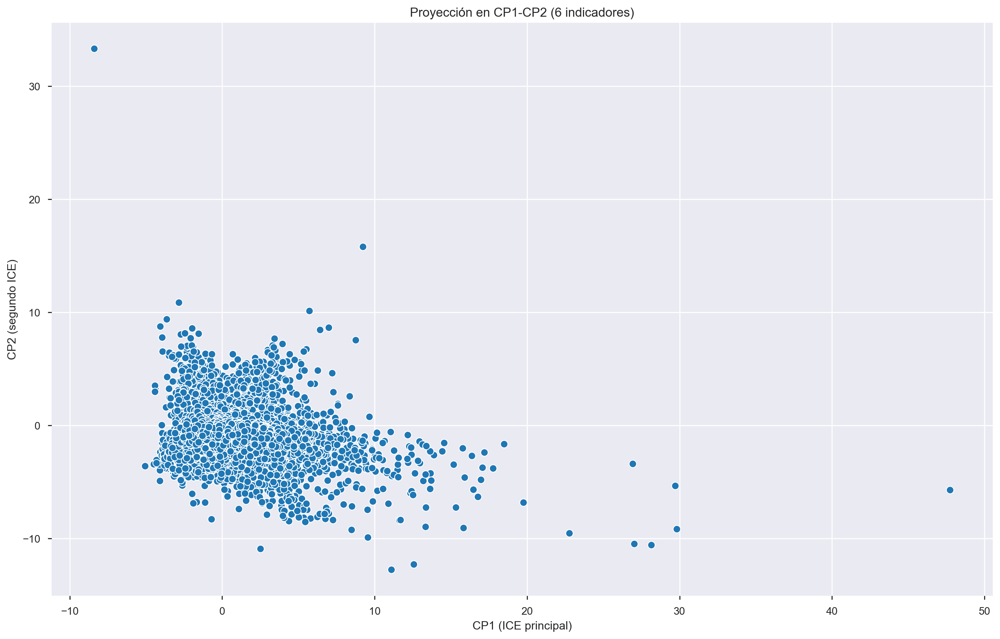

In [32]:
#Scatter plot (seaborn)  PC1 vs PC2
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python)

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="PC1", y="PC2", 
                data=df_pca_results_ind6)
# Set x-axis label
plt.xlabel('PC1 (ICE principal)')
# Set y-axis label
plt.ylabel('PC2 (segundo ICE)')
plt.title('Proyección en PC1-PC2 (6 indicadores)')

plt.savefig('Pyplot_PCA_projection_ind6.png',dpi=600)

Gráfica en el espacio CP1, CP2, CP3

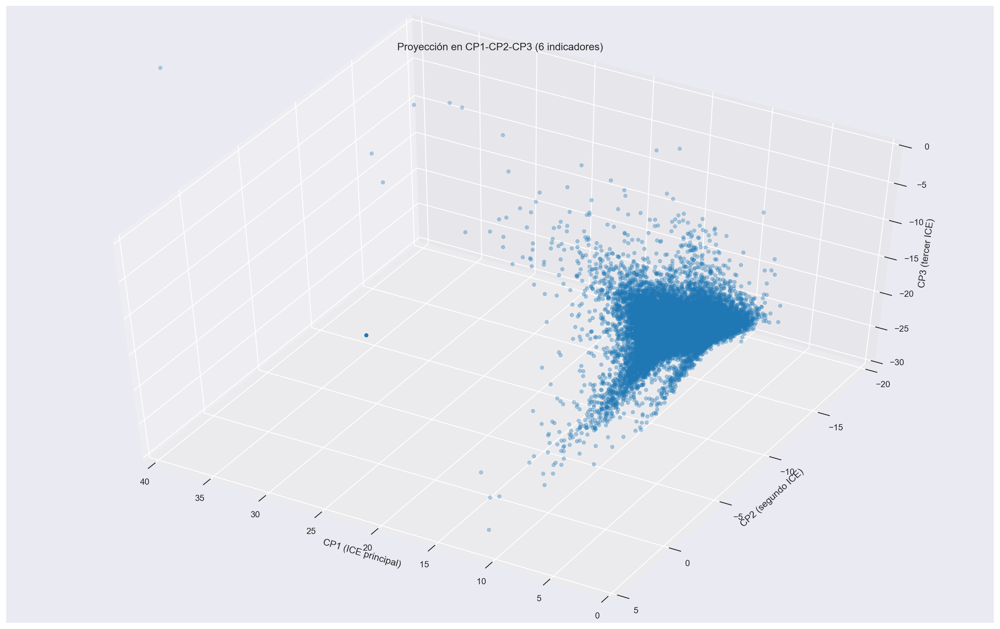

In [33]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

fig = pyplot.figure(figsize=(16, 10), dpi=200, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind6['CP1'], df_pca_results_ind6['CP2'], df_pca_results_ind6['CP3'],s=20)
ax.set_xlim3d(0, 40)
ax.set_ylim3d(-20,5)
ax.set_zlim3d(-30,0)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
ax.view_init(elev, azim)
ax.set_title('Proyección en CP1-CP2-CP3 (6 indicadores)')

plt.savefig('Pyplot_PCA_3dprojection_ind6.png',dpi=600)
pyplot.show()

Gráfica 3d animada

In [34]:
# import plotly.express as px

# fig = px.scatter_3d(df_pca_results_ind6, 
#                     x='CP1', 
#                     y='CP2', 
#                     z='CP3')
# fig.update_layout(scene = dict(
#                     xaxis_title='CP1 (ICE principal)',
#                     yaxis_title='CP2 (segundo ICE)',
#                     zaxis_title='CP3 (tercer ICE)'),
#                  legend_orientation="h")
# fig.show()

<br>

## PCA con 6 indicadores (con transformación log en LNE y Densidad_LNE)

In [35]:
from sklearn.decomposition import PCA

#calculo de PCA (con las 6 componentes), y obtención de los valores CP para cada sección
pca_6cp_tf = PCA(n_components=6)
pca_ind6_tf = pca_6cp_tf.fit_transform(x_1)

#razones de varianza explicada por cada CP 
print('Razón de varianza explicada por cada CP (n_components=6): %s'
      % str(pca_6cp_tf.explained_variance_ratio_))

#dataframe con los valores de los 6 CP por sección
df_pca_ind6_tf = pd.DataFrame(data = pca_ind6_tf
             , columns = ['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6'])
df_pca_ind6_tf

Razón de varianza explicada por cada CP (n_components=6): [0.36810919 0.27563573 0.14463988 0.09007099 0.07055618 0.05098803]


,CP1,CP2,CP3,CP4,CP5,CP6
0,-2.079005,0.766642,0.145209,-0.120979,0.762899,0.028320
1,-1.363579,0.803037,1.410818,-0.441983,0.222827,-0.043094
2,-1.806835,0.314006,0.965597,-0.567216,0.240176,0.022754
3,-1.724235,0.184408,0.487700,-0.456015,0.404533,-0.432180
4,-1.638394,-0.992583,1.593820,-2.020650,0.681931,0.785433
...,...,...,...,...,...,...
68385,2.248044,1.091231,1.299926,1.098096,-1.314330,-0.237932
68386,3.432636,1.207635,1.153325,1.008162,-0.943577,0.127455
68387,7.722265,3.438846,-0.681264,0.439350,0.968434,1.103935
68388,5.007687,1.535965,0.887596,0.656250,-0.364164,0.272452


In [36]:
#obtención de los pesos por cada variable
pca_pesos_ind6_tf = pca_6cp_tf.components_
print(pca_pesos_ind6_tf)

#transformación a un dataframe:
df_pca_pesos_ind6_tf = pd.DataFrame(pca_pesos_ind6_tf, columns=ind6_tf)
principal_components_pesos = pd.DataFrame(['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6'])
df_pca_pesos_ind6_tf.insert(0, 'Componentes Principales', principal_components_pesos)

#se guarda el último dataframe en un csv
df_pca_pesos_ind6_tf.to_csv(r'Resultados_Secc_PCA_pesos_ind6_tf.csv', index = None)

df_pca_pesos_ind6_tf=df_pca_pesos_ind6_tf.set_index('Componentes Principales')
df_pca_pesos_ind6_tf

[[-0.02138292 -0.2043999  -0.42393418  0.57539425  0.57002181  0.34934205]
 [-0.61055764 -0.56732633 -0.20061046 -0.18191728  0.0972267  -0.47177189]
 [ 0.3685735   0.33320222 -0.67967815 -0.18353412  0.11585047 -0.49402566]
 [-0.69652134  0.69810788 -0.11476272  0.03009149  0.04237895  0.10784926]
 [ 0.07369612  0.1863836   0.5475311   0.05634531  0.6852049  -0.43285006]
 [-0.01851002  0.05695917  0.07149877  0.77334501 -0.42532228 -0.46080301]]


,log(LNE),log(Densidad_LNE),Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Autocorr_LNE
Componentes Principales,,,,,,
CP1,-0.021383,-0.204400,-0.423934,0.575394,0.570022,0.349342
CP2,-0.610558,-0.567326,-0.200610,-0.181917,0.097227,-0.471772
CP3,0.368574,0.333202,-0.679678,-0.183534,0.115850,-0.494026
CP4,-0.696521,0.698108,-0.114763,0.030091,0.042379,0.107849
CP5,0.073696,0.186384,0.547531,0.056345,0.685205,-0.432850
CP6,-0.018510,0.056959,0.071499,0.773345,-0.425322,-0.460803


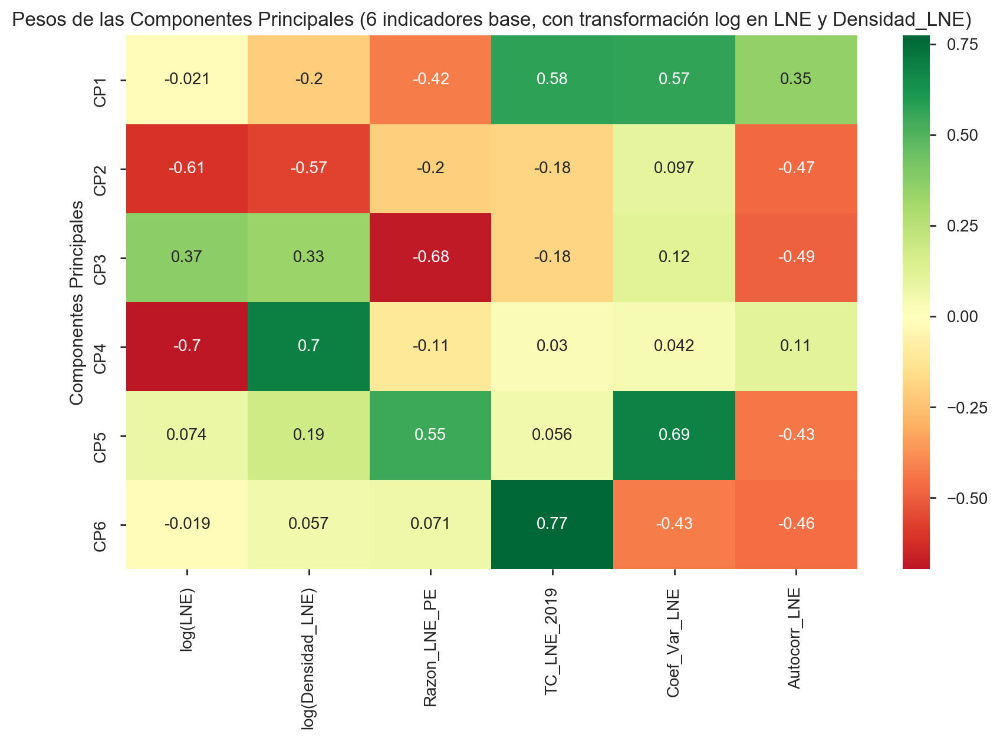

In [37]:
plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(df_pca_pesos_ind6_tf, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Pesos de las Componentes Principales (6 base indicators, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_heatmap_ind6_tf.png',dpi=600,bbox_inches="tight")
plt.show() 

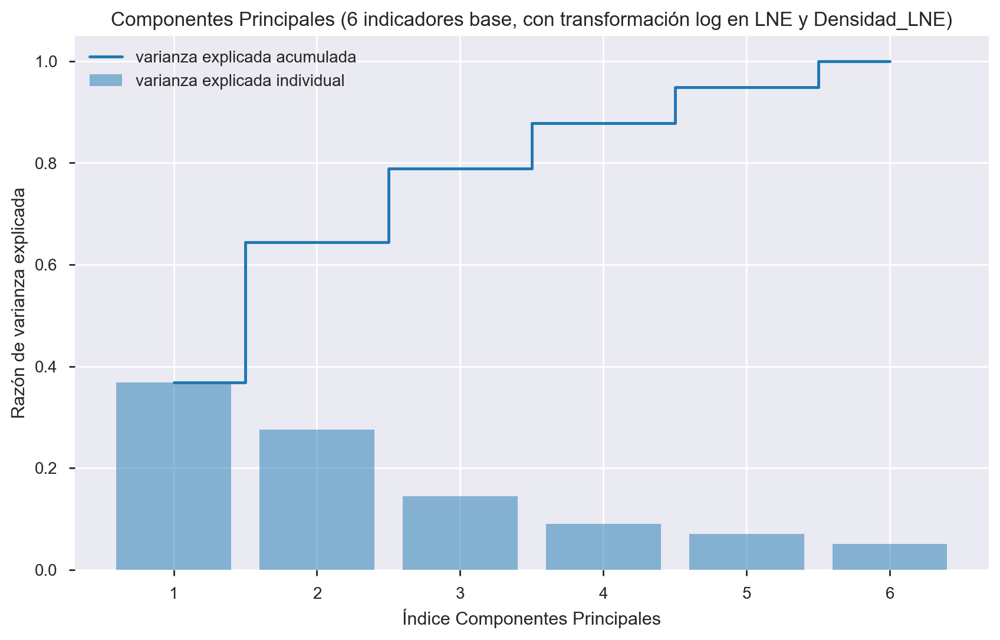

In [38]:

#calculo de la matriz de covarianza y sus correspondientes eigenvalores y eigenvectores
cov_mat = np.cov(x_1.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# calculate of individual and cumulative sum of explained variances
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# plot explained variances
plt.figure(figsize=(10,6), dpi= 200)
plt.bar(range(1,7), var_exp, alpha=0.5,
        align='center', label='varianza explicada individual')
plt.step(range(1,7), cum_var_exp, where='mid',
         label='varianza explicada acumulada')
plt.ylabel('Razón de varianza explicada')
plt.xlabel('Índice Componentes Principales')
plt.legend(loc='best')
plt.title('Componentes Principales (6 base indicators, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_variance_ind6_tf.png',dpi=600)
plt.show()

In [39]:
#concatenamos los resultados con los metadatos
df_pca_results_ind6_tf = pd.concat([metadatos[labels], df_pca_ind6_tf], axis = 1)
df_pca_results_ind6_tf.head()
#salvar resultados PCA
df_pca_results_ind6_tf.to_csv(r'Resultados_Secc_PCA_ind6_tf.csv', index = None)

### Proyección de las secciones en el espacio de Componentes Principales (6 indicadores con transformación log)
Gráfica en el espacio CP1, CP2

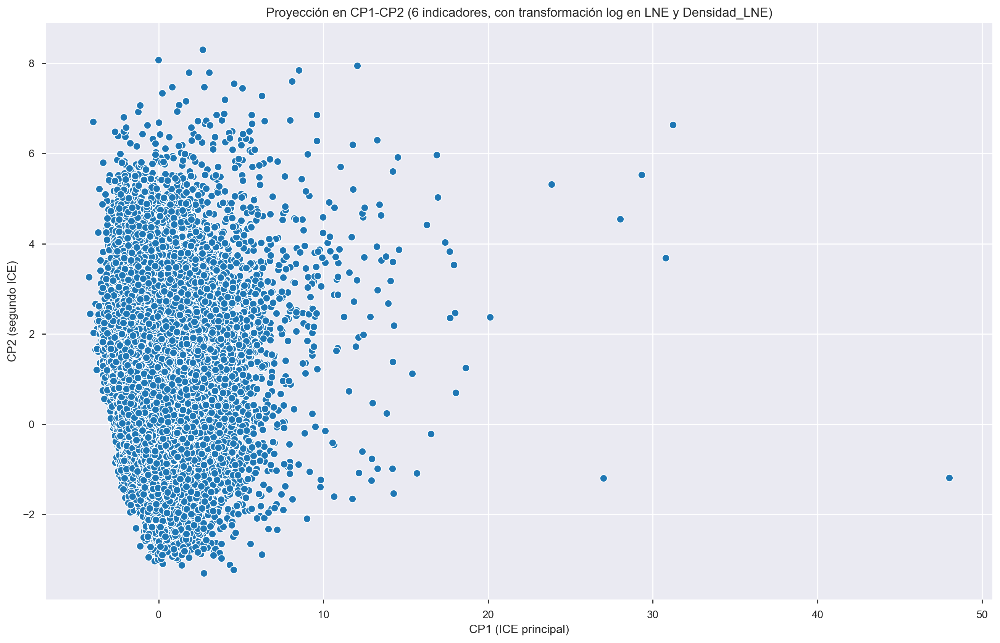

In [40]:
#Scatter plot (seaborn)  PC1 vs PC2
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python)

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="CP1", y="CP2", 
                data=df_pca_results_ind6_tf)
# Set x-axis label
plt.xlabel('CP1 (ICE principal)')
# Set y-axis label
plt.ylabel('CP2 (segundo ICE)')
plt.title('Proyección en CP1-CP2 (6 indicadores, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_projection_ind6_tf.png',dpi=600)

Gráfica en el espacio CP1, CP2, CP3

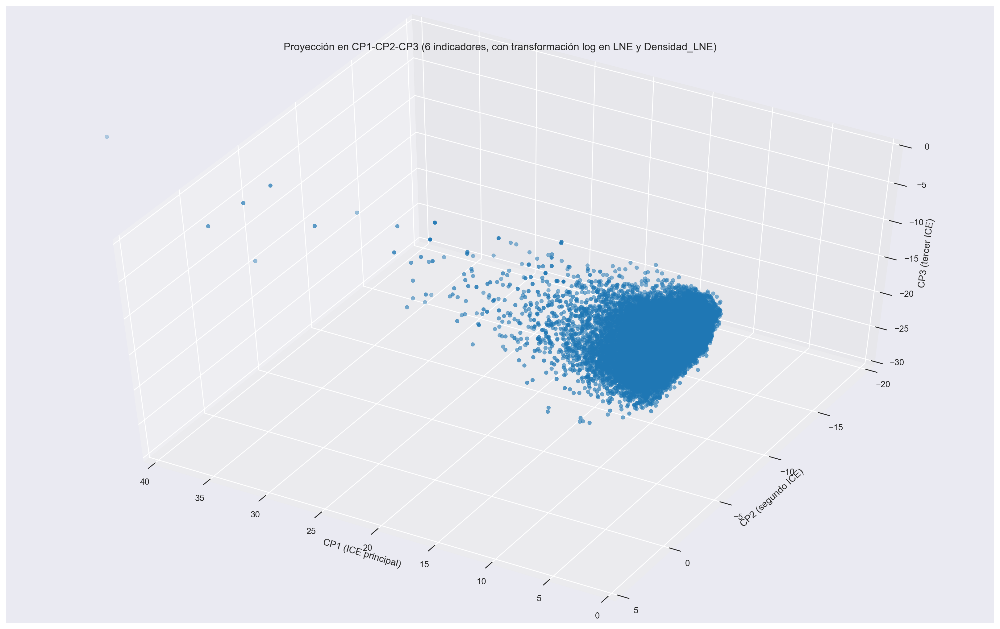

In [41]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

fig = pyplot.figure(figsize=(16, 10), dpi=200, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind6_tf['CP1'], df_pca_results_ind6_tf['CP2'], df_pca_results_ind6_tf['CP3'],s=20)
ax.set_xlim3d(0, 40)
ax.set_ylim3d(-20,5)
ax.set_zlim3d(-30,0)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
ax.view_init(elev, azim)
ax.set_title('Proyección en CP1-CP2-CP3 (6 indicadores, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_3dprojection_ind6_tf.png',dpi=600)
pyplot.show()

Gráfica 3d animada

In [42]:
# import plotly.express as px

# fig = px.scatter_3d(df_pca_results_ind6_tf, 
#                     x='CP1', 
#                     y='CP2', 
#                     z='CP3')
# fig.update_layout(scene = dict(
#                     xaxis_title='CP1 (ICE principal)',
#                     yaxis_title='CP2 (segundo ICE)',
#                     zaxis_title='CP3 (tercer ICE)'),
#                  legend_orientation="h")
# fig.show()

## PCA con 7 indicadores

In [43]:
from sklearn.decomposition import PCA

#calculo de PCA con 7 componentes, y obtención de los valores de CP para cada sección
pca_7cp = PCA(n_components=7)
pca_ind7 = pca_7cp.fit_transform(x_2)

#razones de varianza explicada por cada CP 
print('Razón de varianza explicada por cada CP (n_components=7): %s'
      % str(pca_7cp.explained_variance_ratio_))

#dataframe con los valores de los CP por sección
df_pca_ind7 = pd.DataFrame(data = pca_ind7
             , columns = ['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7'])
df_pca_ind7

Razón de varianza explicada por cada CP (n_components=7): [0.42840341 0.18089508 0.13606747 0.1233544  0.08329319 0.046764
 0.00122245]


,CP1,CP2,CP3,CP4,CP5,CP6,CP7
0,-2.003312,-1.066122,-0.416856,-0.115427,0.893910,0.154362,-0.013757
1,-1.241063,-1.579007,-0.529636,0.771114,0.090961,-0.065632,-0.069262
2,-1.809126,-0.989252,-0.694549,0.501764,0.171309,0.006920,-0.035429
3,-1.562228,-0.755214,-0.587611,0.153895,0.606307,-0.396737,-0.043915
4,-1.328169,1.308551,-4.184244,3.047104,0.246219,0.899870,0.043481
...,...,...,...,...,...,...,...
68385,2.316336,-1.378922,0.602772,0.449431,-1.730148,-0.616728,-0.101677
68386,3.681362,-1.384203,0.704292,0.362801,-1.520000,-0.123895,-0.096343
68387,8.624966,-1.500667,1.202212,-0.002595,0.467734,1.642347,-0.043295
68388,5.585770,-1.443765,0.861886,0.319947,-0.946598,0.244629,-0.107376


In [44]:
#obtención de los pesos por cada variable
pca_pesos_ind7 = pca_7cp.components_
print(pca_pesos_ind7)

#transformación a un dataframe:
df_pca_pesos_ind7 = pd.DataFrame(pca_pesos_ind7, columns=ind7)
principal_components_pesos = pd.DataFrame(['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7'])
df_pca_pesos_ind7.insert(0, 'Componentes Principales', principal_components_pesos)

#se guarda el último dataframe en un csv
df_pca_pesos_ind7.to_csv(r'Resultados_Secc_PCA_pesos_ind7.csv', index = None)

df_pca_pesos_ind7=df_pca_pesos_ind7.set_index('Componentes Principales')
df_pca_pesos_ind7

[[ 0.07337992 -0.12008016 -0.34094289  0.46405617  0.53361254  0.53765822
   0.27347259]
 [ 0.44757787  0.42736761  0.36321884  0.24938077 -0.15286841 -0.11497801
   0.62154935]
 [-0.70736729  0.68497537 -0.11856208  0.05377991  0.04271678  0.03325859
   0.10276257]
 [ 0.54173519  0.55206219 -0.43364985 -0.19632096  0.08307026  0.06719214
  -0.40464893]
 [ 0.01762122  0.15246043  0.70935535 -0.25409329  0.41570303  0.41583546
  -0.25093578]
 [ 0.00418411  0.07568217  0.21550239  0.7851157  -0.10767952 -0.13895655
  -0.5481815 ]
 [ 0.01076674 -0.00133306  0.00972504 -0.00753919  0.70622916 -0.70700405
   0.03341452]]


,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
Componentes Principales,,,,,,,
CP1,0.073380,-0.120080,-0.340943,0.464056,0.533613,0.537658,0.273473
CP2,0.447578,0.427368,0.363219,0.249381,-0.152868,-0.114978,0.621549
CP3,-0.707367,0.684975,-0.118562,0.053780,0.042717,0.033259,0.102763
CP4,0.541735,0.552062,-0.433650,-0.196321,0.083070,0.067192,-0.404649
CP5,0.017621,0.152460,0.709355,-0.254093,0.415703,0.415835,-0.250936
CP6,0.004184,0.075682,0.215502,0.785116,-0.107680,-0.138957,-0.548181
CP7,0.010767,-0.001333,0.009725,-0.007539,0.706229,-0.707004,0.033415


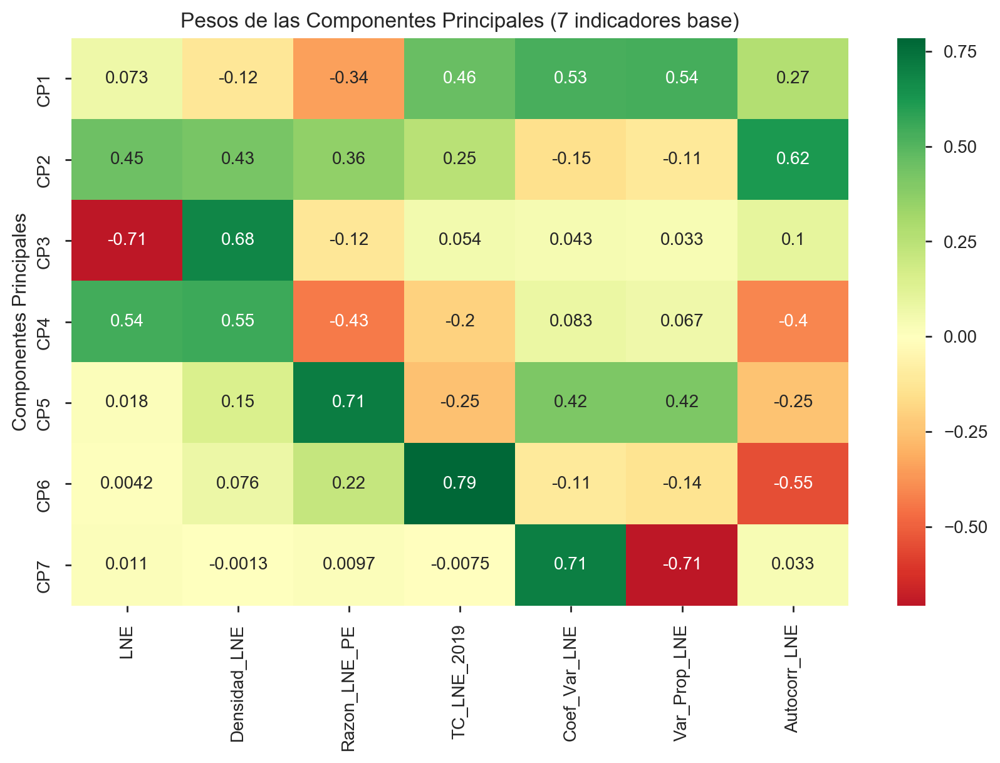

In [45]:
plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(df_pca_pesos_ind7, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Pesos de las Componentes Principales (7 base indicators)')

plt.savefig('Pyplot_PCA_heatmap_ind7.png',dpi=600,bbox_inches="tight")
plt.show() 

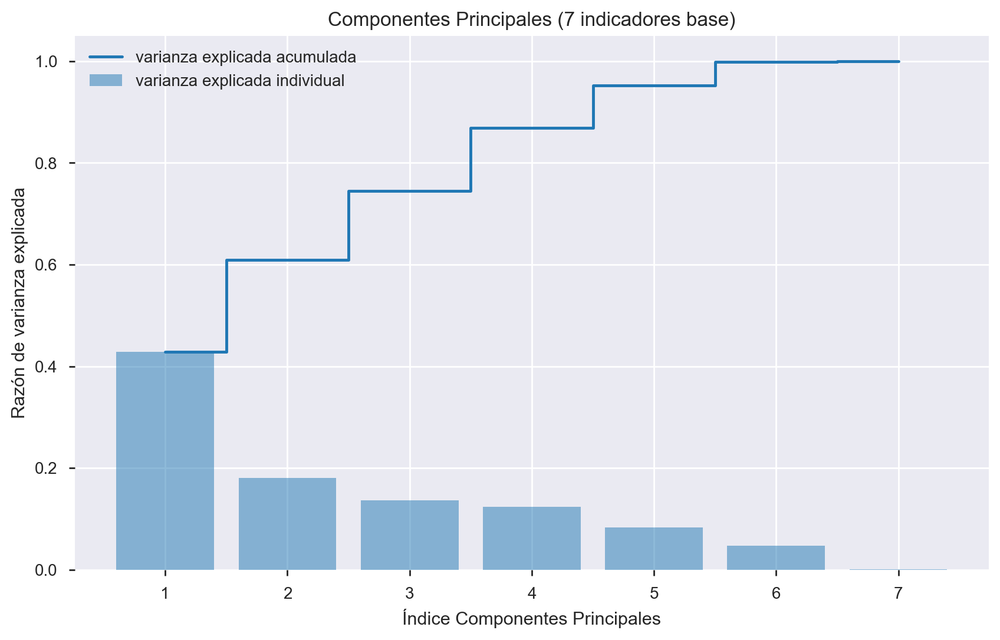

In [46]:

#calculo de la matriz de covarianza y sus correspondientes eigenvalores y eigenvectores
cov_mat = np.cov(x_2.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# calculate of individual and cumulative sum of explained variances
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# plot explained variances
plt.figure(figsize=(10,6), dpi= 200)
plt.bar(range(1,8), var_exp, alpha=0.5,
        align='center', label='varianza explicada individual')
plt.step(range(1,8), cum_var_exp, where='mid',
         label='varianza explicada acumulada')
plt.ylabel('Razón de varianza explicada')
plt.xlabel('Índice Componentes Principales')
plt.legend(loc='best')
plt.title('Componentes Principales (7 base indicators)')

plt.savefig('Pyplot_PCA_variance_ind7.png',dpi=600)
plt.show()

In [47]:
#concatenamos los resultados con los metadatos
df_pca_results_ind7 = pd.concat([metadatos[labels], df_pca_ind7], axis = 1)
df_pca_results_ind7.head()
#salvar resultados PCA
df_pca_results_ind7.to_csv(r'Resultados_Secc_PCA_ind7.csv', index = None)

### Proyección de las secciones en el espacio de Componentes Principales (7 indicadores)
Gráfica en el espacio CP1, CP2

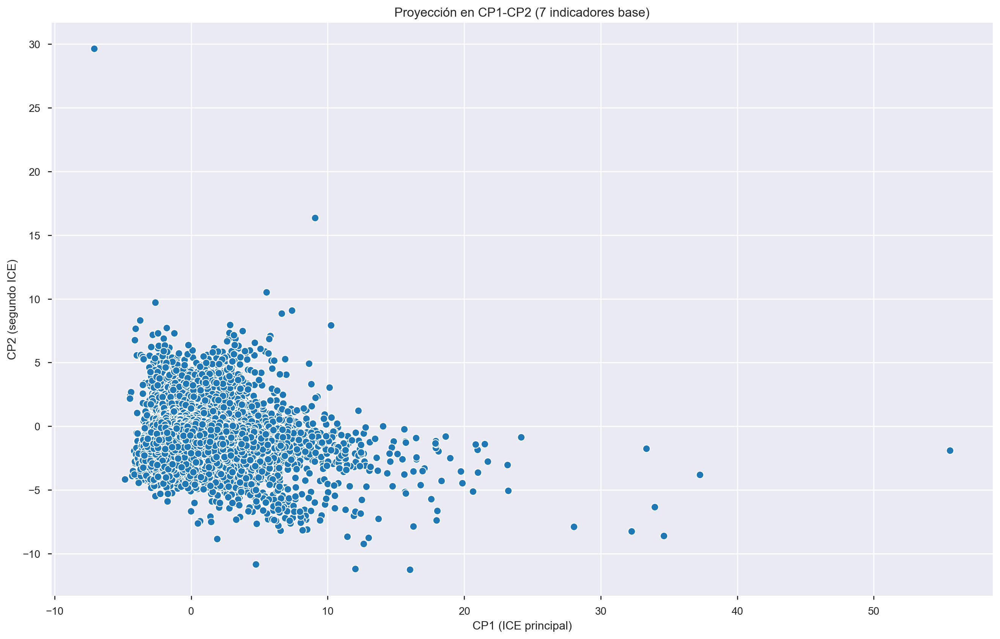

In [48]:
#Scatter plot (seaborn) PC1 vs PC2

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="CP1", y="CP2", 
                data=df_pca_results_ind7)
# Set x-axis label
plt.xlabel('CP1 (ICE principal)')
# Set y-axis label
plt.ylabel('CP2 (segundo ICE)')
plt.title('Proyección en CP1-CP2 (7 base indicators)')

plt.savefig('Pyplot_PCA_projection_ind7.png',dpi=600)

Gráfica en el espacio CP1, CP2, CP3

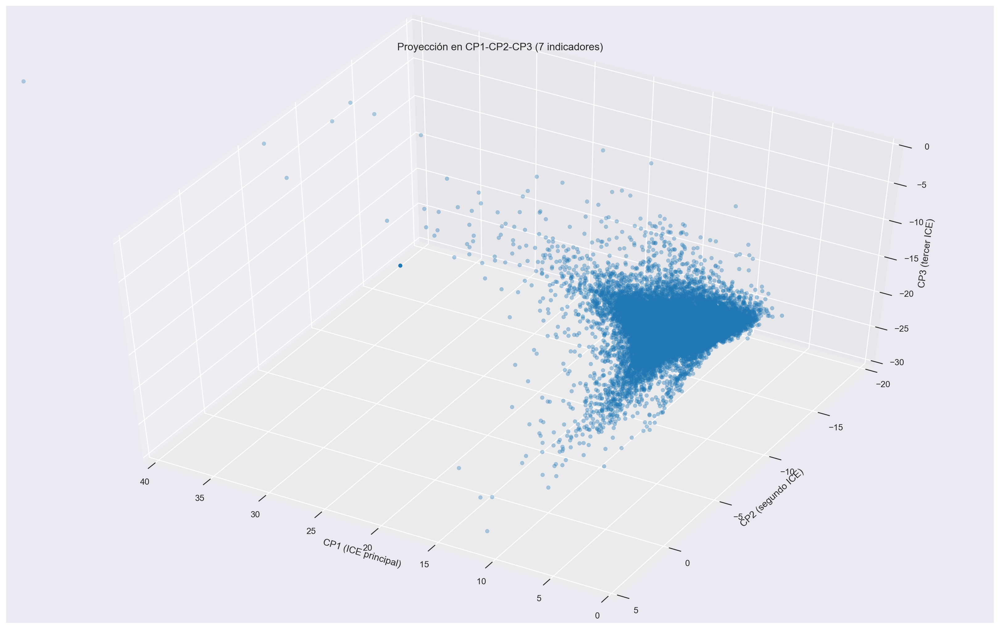

In [49]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

fig = pyplot.figure(figsize=(16, 10), dpi=200, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind7['CP1'], df_pca_results_ind7['CP2'], df_pca_results_ind7['CP3'],s=20)
ax.set_xlim3d(0, 40)
ax.set_ylim3d(-20,5)
ax.set_zlim3d(-30,0)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
ax.view_init(elev, azim)
ax.set_title('Proyección en CP1-CP2-CP3 (7 indicadores)')

plt.savefig('Pyplot_PCA_3dprojection_ind7.png',dpi=600)
pyplot.show()

Gráfica 3d animada

In [50]:
# import plotly.express as px

# fig = px.scatter_3d(df_pca_results_ind7, 
#                     x='CP1', 
#                     y='CP2', 
#                     z='CP3')
# fig.update_layout(scene = dict(
#                     xaxis_title='CP1 (ICE principal)',
#                     yaxis_title='CP2 (segundo ICE)',
#                     zaxis_title='CP3 (tercer ICE)'),
#                  legend_orientation="h")
# fig.show()

## PCA con 7 indicadores (transformación log en LNE y Densidad)

In [51]:
from sklearn.decomposition import PCA

#calculo de PCA con 7 componentes, y obtención de los valores de CP para cada sección
pca_7cp_tf = PCA(n_components=7)
pca_ind7_tf = pca_7cp_tf.fit_transform(x_3)

#razones de varianza explicada por cada CP 
print('Razón de varianza explicada por cada CP (n_components=7): %s'
      % str(pca_7cp_tf.explained_variance_ratio_))

#dataframe con los valores de los CP por sección
df_pca_ind7_tf = pd.DataFrame(data = pca_ind7_tf
             , columns = ['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7'])
df_pca_ind7_tf

Razón de varianza explicada por cada CP (n_components=7): [0.43121373 0.23671935 0.12503344 0.08249623 0.07699423 0.04632545
 0.00121757]


,CP1,CP2,CP3,CP4,CP5,CP6,CP7
0,-1.998150,0.896007,0.299150,0.934860,-0.324690,0.209161,-0.010563
1,-1.261402,0.890648,1.483427,0.185499,-0.494662,-0.001004,-0.062374
2,-1.877799,0.420301,1.049566,0.208261,-0.624435,0.063948,-0.028986
3,-1.624315,0.296424,0.620355,0.630815,-0.597256,-0.340265,-0.038426
4,-1.832179,-0.895257,1.665424,-0.038708,-2.072460,0.933910,0.023131
...,...,...,...,...,...,...,...
68385,2.372541,0.954862,1.097777,-1.296321,1.401862,-0.563170,-0.108431
68386,3.782032,1.012125,0.929745,-1.164888,1.270552,-0.090998,-0.102097
68387,9.246257,3.039946,-0.908062,0.066689,0.385870,1.430218,-0.060159
68388,5.801376,1.269742,0.666433,-0.799544,0.819671,0.221832,-0.111531


In [52]:
#obtención de los pesos por cada variable
pca_pesos_ind7_tf = pca_7cp_tf.components_
print(pca_pesos_ind7_tf)

#transformación a un dataframe:
df_pca_pesos_ind7_tf = pd.DataFrame(pca_pesos_ind7_tf, columns=ind7_tf)
principal_components_pesos = pd.DataFrame(['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7'])
df_pca_pesos_ind7_tf.insert(0, 'Componentes Principales', principal_components_pesos)

#se guarda el último dataframe en un csv
df_pca_pesos_ind7_tf.to_csv(r'Resultados_Secc_PCA_pesos_ind7_tf.csv', index = None)

df_pca_pesos_ind7_tf=df_pca_pesos_ind7_tf.set_index('Componentes Principales')
df_pca_pesos_ind7_tf

[[-3.39654505e-02 -1.76281298e-01 -3.48303403e-01  4.54320801e-01
   5.36192493e-01  5.38048238e-01  2.51098198e-01]
 [-6.05925544e-01 -5.48929126e-01 -1.69100829e-01 -2.23958461e-01
   6.36691805e-02  3.04074841e-02 -4.97795327e-01]
 [ 3.75371350e-01  3.67350301e-01 -6.05258229e-01 -2.42309356e-01
   1.12523552e-01  9.08505830e-02 -5.27430926e-01]
 [-9.89888266e-02  3.33944742e-01  6.14232889e-01 -2.73881767e-01
   4.25347238e-01  4.26123556e-01 -2.52759370e-01]
 [-6.93435977e-01  6.39599095e-01 -2.50138580e-01  8.19417600e-02
  -6.95325904e-02 -7.69123818e-02  1.73278636e-01]
 [ 6.15480906e-04  1.09757254e-01  2.09278447e-01  7.76497443e-01
  -9.66036117e-02 -1.25529917e-01 -5.62243009e-01]
 [ 1.20129880e-02  1.65132044e-03  1.01639544e-02 -6.88767914e-03
   7.07598039e-01 -7.05741518e-01  3.05964101e-02]]


,log(LNE),log(Densidad_LNE),Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
Componentes Principales,,,,,,,
CP1,-0.033965,-0.176281,-0.348303,0.454321,0.536192,0.538048,0.251098
CP2,-0.605926,-0.548929,-0.169101,-0.223958,0.063669,0.030407,-0.497795
CP3,0.375371,0.367350,-0.605258,-0.242309,0.112524,0.090851,-0.527431
CP4,-0.098989,0.333945,0.614233,-0.273882,0.425347,0.426124,-0.252759
CP5,-0.693436,0.639599,-0.250139,0.081942,-0.069533,-0.076912,0.173279
CP6,0.000615,0.109757,0.209278,0.776497,-0.096604,-0.125530,-0.562243
CP7,0.012013,0.001651,0.010164,-0.006888,0.707598,-0.705742,0.030596


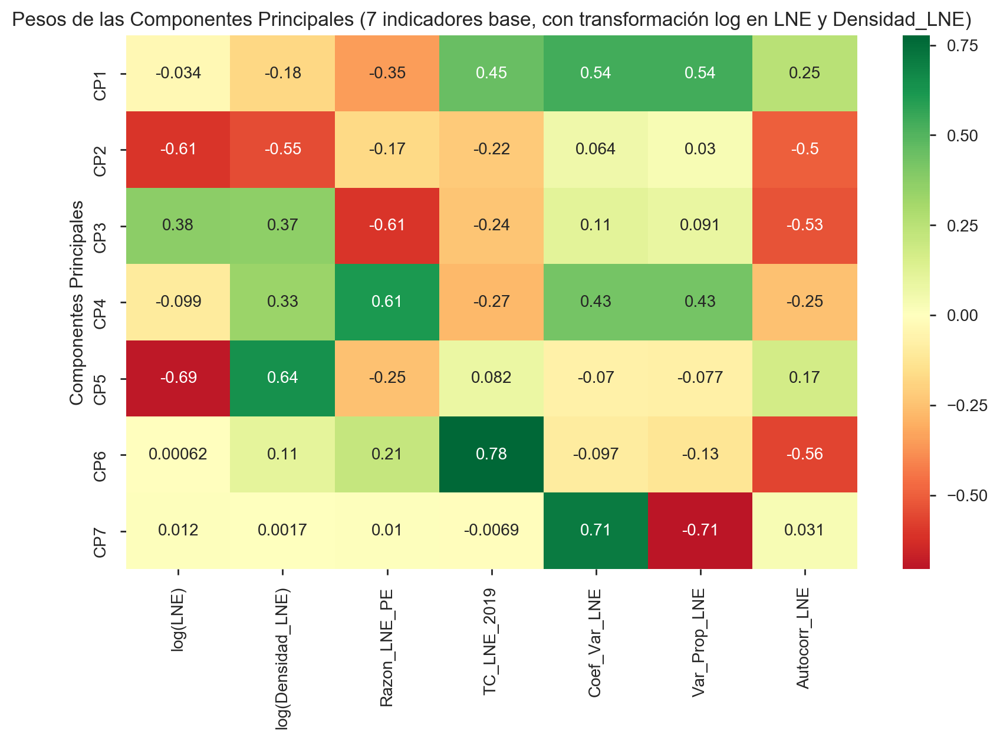

In [53]:
plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(df_pca_pesos_ind7_tf, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Pesos de las Componentes Principales (7 base indicators, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_heatmap_ind7_tf.png',dpi=600,bbox_inches="tight")
plt.show() 

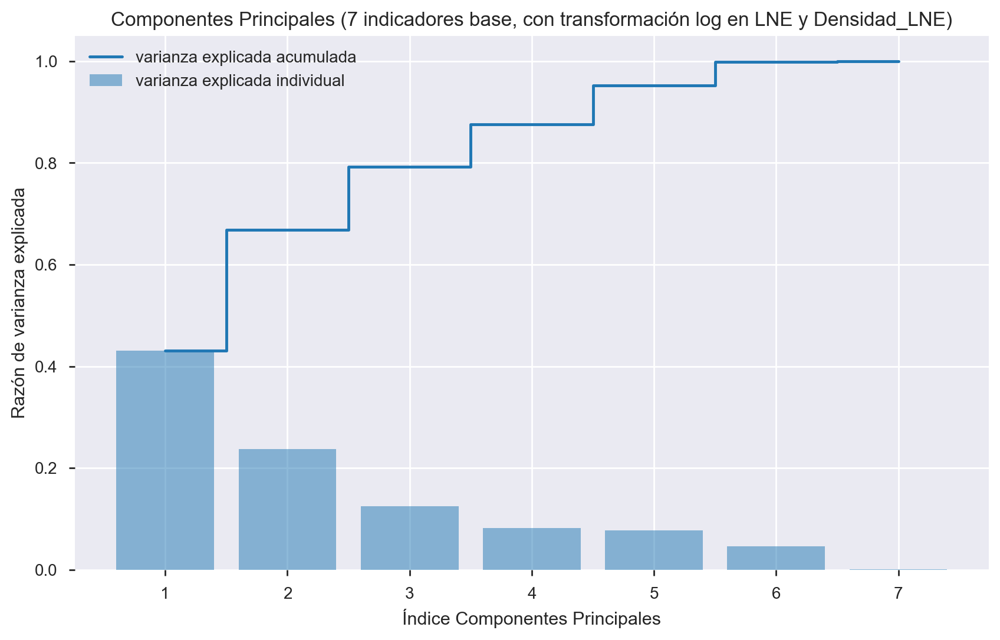

In [54]:

#calculo de la matriz de covarianza y sus correspondientes eigenvalores y eigenvectores
cov_mat = np.cov(x_3.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# calculate of individual and cumulative sum of explained variances
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# plot explained variances
plt.figure(figsize=(10,6), dpi= 200)
plt.bar(range(1,8), var_exp, alpha=0.5,
        align='center', label='varianza explicada individual')
plt.step(range(1,8), cum_var_exp, where='mid',
         label='varianza explicada acumulada')
plt.ylabel('Razón de varianza explicada')
plt.xlabel('Índice Componentes Principales')
plt.legend(loc='best')
plt.title('Componentes Principales (7 base indicators, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_variance_ind7_tf.png',dpi=600)
plt.show()

In [55]:
#concatenamos los resultados con los metadatos
df_pca_results_ind7_tf = pd.concat([metadatos[labels], df_pca_ind7_tf], axis = 1)
df_pca_results_ind7_tf.head()
#salvar resultados PCA
df_pca_results_ind7_tf.to_csv(r'Resultados_Secc_PCA_ind7_tf.csv', index = None)

### Proyección de las secciones en el espacio de Componentes Principales (7 indicadores con transformación log)
Gráfica en el espacio CP1, CP2

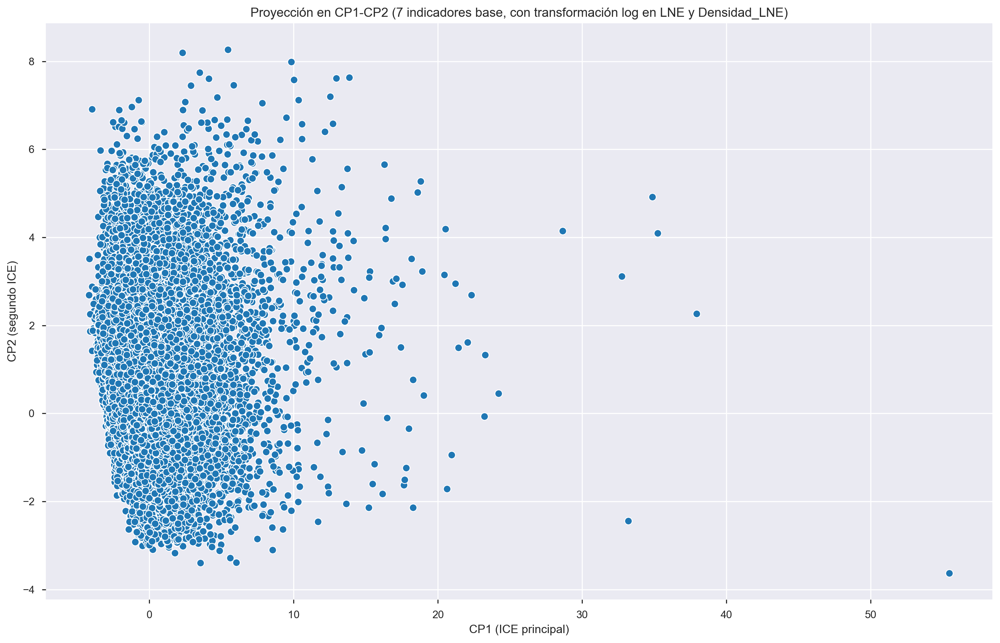

In [56]:
#Scatter plot (seaborn) PC1 vs PC2

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="CP1", y="CP2", 
                data=df_pca_results_ind7_tf)
# Set x-axis label
plt.xlabel('CP1 (ICE principal)')
# Set y-axis label
plt.ylabel('CP2 (segundo ICE)')
plt.title('Proyección en CP1-CP2 (7 base indicators, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_projection_ind7_tf.png',dpi=600)

Gráfica en el espacio CP1, CP2, CP3

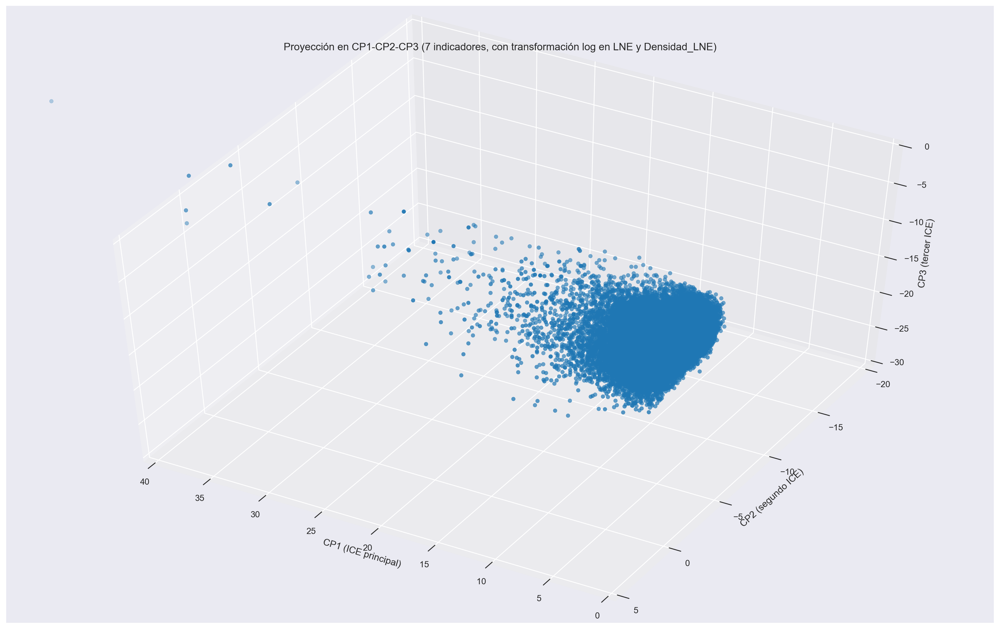

In [57]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

fig = pyplot.figure(figsize=(16, 10), dpi=200, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind7_tf['CP1'], df_pca_results_ind7_tf['CP2'], df_pca_results_ind7_tf['CP3'],s=20)
ax.set_xlim3d(0, 40)
ax.set_ylim3d(-20,5)
ax.set_zlim3d(-30,0)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
ax.view_init(elev, azim)
ax.set_title('Proyección en CP1-CP2-CP3 (7 indicadores, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_3dprojection_ind7_tf.png',dpi=600)
pyplot.show()

Gráfica 3d animada

In [58]:
# import plotly.express as px

# fig = px.scatter_3d(df_pca_results_ind7_tf, 
#                     x='CP1', 
#                     y='CP2', 
#                     z='CP3')
# fig.update_layout(scene = dict(
#                     xaxis_title='CP1 (ICE principal)',
#                     yaxis_title='CP2 (segundo ICE)',
#                     zaxis_title='CP3 (tercer ICE)'),
#                  legend_orientation="h")
# fig.show()

<br>

## Referencias
- https://www.analyticsvidhya.com/blog/2018/08/dimensionality-reduction-techniques-python/
- https://plot.ly/python/v3/ipython-notebooks/principal-component-analysis/#pca-vs-lda
- https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python
- https://towardsdatascience.com/visualising-high-dimensional-datasets-using-pca-and-t-sne-in-python-8ef87e7915b
- https://alexanderfabisch.github.io/t-sne-in-scikit-learn.html
- https://medium.com/@indreshbhattacharyya/feature-selection-categorical-feature-selection-boruta-light-gbm-chi-square-bf47e94e2558
- https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
- https://stackoverflow.com/questions/52472757/creating-a-boxplot-facetgrid-in-seaborn-for-python
- https://www.kdnuggets.com/2019/07/10-simple-hacks-speed-data-analysis-python.html
- https://github.com/adam-p/markdown-here/wiki/Markdown-Here-Cheatsheet